In [ ]:
!pip install opencv-contrib-python

In [3]:
import cv2 
import os
import pickle
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
from pathlib import Path

In [4]:
#path='C:/Users/SHINJINI GHOSH/Desktop/cow/Train_original/'
path='C:/Users/royre/Downloads/coding ninjas data science/Train_original/'
pathtest='C:/Users/royre/Downloads/coding ninjas data science/test_full/'

In [5]:
def loadTest(image_list):
    image_mat_array =[]
    fig, axs = plt.subplots(21,15,figsize=(20,20))
    i=0
    for image in image_list:
        img = Image.open(image).convert("L")
        ax = plt.subplot(21,15,i+1)
        i+=1
        plt.imshow(img, cmap='gray')
        fig.suptitle("Test Images", fontsize=30)
        arr = np.array(img)
        image_mat_array.append(arr)
        
    return image_mat_array   


In [6]:
def load(image_list):
    image_mat_array =[]
    fig, axs = plt.subplots(63,40,figsize=(20,20))
    i=0
    for image in image_list:
        img = Image.open(image).convert("L")
        ax = plt.subplot(63,40,i+1)
        i+=1
        plt.imshow(img, cmap='gray')
        fig.suptitle("Train Images", fontsize=30)
        arr = np.array(img)
        image_mat_array.append(arr)
        
    return image_mat_array

In [7]:

# Resize images to a similar dimension
# This helps improve accuracy and decreases unnecessarily high number of keypoints

def imageResizeTrain(image):
    maxD = 1024
    height,width = image.shape
    aspectRatio = width/height
    if aspectRatio < 1:
        newSize = (int(maxD*aspectRatio),maxD)
    else:
        newSize = (maxD,int(maxD/aspectRatio))
    image = cv2.resize(image,newSize)
    return image

def imageResizeTest(image):
    maxD = 1024
    height,width,channel = image.shape
    aspectRatio = width/height
    if aspectRatio < 1:
        newSize = (int(maxD*aspectRatio),maxD)
    else:
        newSize = (maxD,int(maxD/aspectRatio))
    image = cv2.resize(image,newSize)
    return image

In [8]:
def save_image(image_obj,filename):
    if not os.path.exists(os.path.dirname(filename)):
        try:
            os.makedirs(os.path.dirname(filename))
        except OSError as exc: # Guard against race condition
            if exc.errno != errno.EEXIST:
                raise
    
    height, width = image_obj.shape
    grayLevelImage = Image.new("L",(width,height))
    for i in range(0,width):
        for j in range(0,height):
            grayLevelImage.putpixel((i,j),int(image_obj[j][i]))
    grayLevelImage.save((filename+".JPG"),"JPEG")
    

In [10]:
train={}
training_images_list=[]
name=['2021','2114','2140','2191','2192','2219','2244','2248','2294','2319','2324','2350','2352','2353','2356',
      '2361','2370','2373','2383','2394','2400','2405','2407','2412','2413','2419','2420','2438','2441','2446','2448','2452',
      '2454','2458','2461','2465','2467','2468','2469','2472','2478','2479','2487','2489','2490','2491','2497','2498','2503',
      '2505','2520','2535','2585','2586','2589','2590','2598','2606','2608','2618','2624','2625','2635']
for i in name:
    training_images_list=[]
    for k in os.listdir(path+str(i)):
                    training_images_list.append(k)
    train[i]=training_images_list
print('Training Images : ',train)
print('Count : ',len(train))
imageList =[]
for i in name:
    #training = ["C:/Users/SHINJINI GHOSH/Desktop/train_cow/"+i+"/"+x for x in train[i]]
    for values in train[i]:
        imageList.append(f"{path}{i}/{values}")
print(len(imageList))
#training_images_matrices = load(imageList)

Training Images :  {'2021': ['IMG_20201013_123825.jpg', 'IMG_20201013_123826.jpg', 'IMG_20201013_123827.jpg', 'IMG_20201013_123828.jpg', 'IMG_20201013_123829.jpg', 'IMG_20201013_123831.jpg', 'IMG_20201013_123832.jpg', 'IMG_20201013_123836.jpg', 'IMG_20201013_123837.jpg', 'IMG_20201013_123839.jpg', 'IMG_20201013_123840.jpg', 'IMG_20201013_123843.jpg', 'IMG_20201013_123848.jpg', 'IMG_20201013_123849.jpg', 'IMG_20201013_123850.jpg', 'IMG_20201013_123852.jpg', 'IMG_20201013_123854.jpg', 'IMG_20201013_123857.jpg', 'IMG_20201013_123859.jpg', 'IMG_20201013_123906.jpg', 'IMG_20201013_123910.jpg', 'IMG_20201013_123911.jpg', 'IMG_20201013_123913.jpg', 'IMG_20201013_123916.jpg', 'IMG_20201013_123918.jpg', 'IMG_20201013_123919.jpg', 'IMG_20201013_123922.jpg', 'IMG_20201013_123924.jpg', 'IMG_20201013_123925.jpg', 'IMG_20201013_123934.jpg', 'IMG_20201013_123936.jpg', 'IMG_20201013_123939.jpg', 'IMG_20201013_123942.jpg', 'IMG_20201013_123947.jpg', 'IMG_20201013_123948.jpg', 'IMG_20201013_123954.jpg',

In [11]:

test=[]
for k in os.listdir(pathtest):
                test.append(k)
print('Testing Images : ',test)
print('Count : ',len(test))
testList =[]
for values in test:
    testList.append(f"{pathtest}{values}")
print(len(testList))
#test_images_matrices = loadTest(testList)

Testing Images :  ['IMG_20200922_142824_1.jpg', 'IMG_20200922_142831.jpg', 'IMG_20200922_142839.jpg', 'IMG_20200922_142852.jpg', 'IMG_20200922_142900.jpg', 'IMG_20200922_143110.jpg', 'IMG_20200922_143113_1.jpg', 'IMG_20200922_143126.jpg', 'IMG_20200922_143154.jpg', 'IMG_20200922_143207.jpg', 'IMG_20200928_112226.jpg', 'IMG_20200928_112238.jpg', 'IMG_20200928_112250_1.jpg', 'IMG_20200928_112258.jpg', 'IMG_20200928_112305_2.jpg', 'IMG_20200928_112424.jpg', 'IMG_20200928_112438.jpg', 'IMG_20200928_112456.jpg', 'IMG_20200928_112512.jpg', 'IMG_20200928_112531.jpg', 'IMG_20200928_112652.jpg', 'IMG_20200928_112715.jpg', 'IMG_20200928_112724.jpg', 'IMG_20200928_112744.jpg', 'IMG_20200928_112828.jpg', 'IMG_20200928_112932.jpg', 'IMG_20200928_112947.jpg', 'IMG_20200928_112957.jpg', 'IMG_20200928_113010.jpg', 'IMG_20200928_113034.jpg', 'IMG_20200928_113131.jpg', 'IMG_20200928_113143.jpg', 'IMG_20200928_113153.jpg', 'IMG_20200928_113209.jpg', 'IMG_20200928_113230.jpg', 'IMG_20200928_113355.jpg', '

In [12]:
# We use grayscale images for generating keypoints
imagesBW = []
for imageName in imageList:
    print(imageName)
    imagePath =str(imageName)
    imagesBW.append(imageResizeTrain(cv2.imread(imagePath,0)))
    

C:/Users/royre/Downloads/coding ninjas data science/Train_original/2021/IMG_20201013_123825.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2021/IMG_20201013_123826.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2021/IMG_20201013_123827.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2021/IMG_20201013_123828.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2021/IMG_20201013_123829.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2021/IMG_20201013_123831.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2021/IMG_20201013_123832.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2021/IMG_20201013_123836.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2021/IMG_20201013_123837.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2021/IMG_20201013_123839.jpg
C:/Users/royre/Downloads/coding ninjas d

C:/Users/royre/Downloads/coding ninjas data science/Train_original/2140/IMG_20201007_113536.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2191/IMG_20201007_120619_2.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2191/IMG_20201007_120620.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2191/IMG_20201007_120620_1.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2191/IMG_20201007_120624.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2191/IMG_20201007_120626.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2191/IMG_20201007_120628.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2191/IMG_20201007_120639.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2191/IMG_20201007_120645.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2191/IMG_20201007_120646.jpg
C:/Users/royre/Downloads/coding ninj

C:/Users/royre/Downloads/coding ninjas data science/Train_original/2244/IMG_20201007_122734.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2244/IMG_20201007_122736.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2244/IMG_20201007_122737.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2244/IMG_20201007_122740.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2244/IMG_20201007_122742.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2244/IMG_20201007_122744.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2244/IMG_20201007_122746.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2244/IMG_20201007_122748.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2244/IMG_20201007_122749.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2244/IMG_20201007_122753.jpg
C:/Users/royre/Downloads/coding ninjas d

C:/Users/royre/Downloads/coding ninjas data science/Train_original/2319/IMG_20201008_121950.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2319/IMG_20201008_121956_1.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2319/IMG_20201008_121957.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2319/IMG_20201008_122001.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2319/IMG_20201008_122003.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2319/IMG_20201008_122005.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2319/IMG_20201008_122013.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2319/IMG_20201008_122015.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2319/IMG_20201008_122017.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2319/IMG_20201008_122018.jpg
C:/Users/royre/Downloads/coding ninjas

C:/Users/royre/Downloads/coding ninjas data science/Train_original/2352/IMG_20201013_122311.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2352/IMG_20201013_122313.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2352/IMG_20201013_122315.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2352/IMG_20201013_122316.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2352/IMG_20201013_122319.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2352/IMG_20201013_122320.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2352/IMG_20201013_122323.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2352/IMG_20201013_122324.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2352/IMG_20201013_122326.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2352/IMG_20201013_122327.jpg
C:/Users/royre/Downloads/coding ninjas d

C:/Users/royre/Downloads/coding ninjas data science/Train_original/2370/IMG_20200928_113656_1.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2370/IMG_20200928_113658.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2370/IMG_20200928_113659.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2370/IMG_20200928_113700.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2370/IMG_20200928_113701.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2370/IMG_20200928_113703.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2370/IMG_20200928_113704.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2370/IMG_20200928_113706.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2370/IMG_20200928_113707.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2370/IMG_20200928_113708.jpg
C:/Users/royre/Downloads/coding ninjas

C:/Users/royre/Downloads/coding ninjas data science/Train_original/2394/IMG_20201013_123503.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2394/IMG_20201013_123505.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2394/IMG_20201013_123506.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2394/IMG_20201013_123508.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2394/IMG_20201013_123508_1.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2394/IMG_20201013_123510.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2394/IMG_20201013_123512.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2394/IMG_20201013_123515.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2394/IMG_20201013_123517.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2394/IMG_20201013_123519.jpg
C:/Users/royre/Downloads/coding ninjas

C:/Users/royre/Downloads/coding ninjas data science/Train_original/2412/IMG_20201008_121417.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2412/IMG_20201008_121420.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2412/IMG_20201008_121442.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2412/IMG_20201008_121443.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2412/IMG_20201008_121443_1.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2412/IMG_20201008_121443_2.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2412/IMG_20201008_121445.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2412/IMG_20201008_121446.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2412/IMG_20201008_121447.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2412/IMG_20201008_121448.jpg
C:/Users/royre/Downloads/coding ninj

C:/Users/royre/Downloads/coding ninjas data science/Train_original/2441/IMG_20201007_114209.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2441/IMG_20201007_114210.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2441/IMG_20201007_114211.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2441/IMG_20201007_114218.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2441/IMG_20201007_114219_1.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2441/IMG_20201007_114221.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2441/IMG_20201007_114223.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2441/IMG_20201007_114224.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2441/IMG_20201007_114226.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2441/IMG_20201007_114227.jpg
C:/Users/royre/Downloads/coding ninjas

C:/Users/royre/Downloads/coding ninjas data science/Train_original/2452/IMG_20200928_114923.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2452/IMG_20200928_114924.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2452/IMG_20200928_114928.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2452/IMG_20200928_114931.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2452/IMG_20200928_114932.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2452/IMG_20200928_114933.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2452/IMG_20200928_114934.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2452/IMG_20200928_114947.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2452/IMG_20200928_114949.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2452/IMG_20200928_114956.jpg
C:/Users/royre/Downloads/coding ninjas d

C:/Users/royre/Downloads/coding ninjas data science/Train_original/2461/IMG_20200928_112739.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2461/IMG_20200928_112740.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2461/IMG_20200928_112741.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2461/IMG_20200928_112747.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2461/IMG_20200928_112749.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2461/IMG_20200928_112750.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2461/IMG_20200928_112751.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2461/IMG_20200928_112751_1.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2461/IMG_20200928_112755.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2461/IMG_20200928_112815.jpg
C:/Users/royre/Downloads/coding ninjas

C:/Users/royre/Downloads/coding ninjas data science/Train_original/2468/IMG_20201007_121850_1.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2468/IMG_20201007_121851.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2468/IMG_20201007_121851_1.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2468/IMG_20201007_121856.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2468/IMG_20201007_121857.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2468/IMG_20201007_121900.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2468/IMG_20201007_121903.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2468/IMG_20201007_121904.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2469/IMG_20200928_112922.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2469/IMG_20200928_112925.jpg
C:/Users/royre/Downloads/coding ninj

C:/Users/royre/Downloads/coding ninjas data science/Train_original/2479/IMG_20200928_115550.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2479/IMG_20200928_115552.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2479/IMG_20200928_115553.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2479/IMG_20200928_115558.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2479/IMG_20200928_115610.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2479/IMG_20200928_115612.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2479/IMG_20200928_115615.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2479/IMG_20200928_115617.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2479/IMG_20200928_115618.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2479/IMG_20200928_115619.jpg
C:/Users/royre/Downloads/coding ninjas d

C:/Users/royre/Downloads/coding ninjas data science/Train_original/2490/IMG_20200928_114300.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2490/IMG_20200928_114303.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2490/IMG_20200928_114305.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2490/IMG_20200928_114307.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2490/IMG_20200928_114308.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2490/IMG_20200928_114312.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2490/IMG_20200928_114314.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2490/IMG_20200928_114317.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2490/IMG_20200928_114318.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2490/IMG_20200928_114321.jpg
C:/Users/royre/Downloads/coding ninjas d

C:/Users/royre/Downloads/coding ninjas data science/Train_original/2498/IMG_20200928_120140.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2498/IMG_20200928_120141.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2498/IMG_20200928_120142.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2498/IMG_20200928_120149.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2498/IMG_20200928_120156.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2498/IMG_20200928_120159.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2498/IMG_20200928_120207.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2498/IMG_20200928_120208.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2498/IMG_20200928_120210.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2498/IMG_20200928_120211.jpg
C:/Users/royre/Downloads/coding ninjas d

C:/Users/royre/Downloads/coding ninjas data science/Train_original/2520/IMG_20201013_113115.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2520/IMG_20201013_113116.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2520/IMG_20201013_113117.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2520/IMG_20201013_113118.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2520/IMG_20201013_113120.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2520/IMG_20201013_113122.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2520/IMG_20201013_113123.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2520/IMG_20201013_113124.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2520/IMG_20201013_113126.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2520/IMG_20201013_113128.jpg
C:/Users/royre/Downloads/coding ninjas d

C:/Users/royre/Downloads/coding ninjas data science/Train_original/2586/IMG_20201008_114553.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2586/IMG_20201008_114553_1.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2586/IMG_20201008_114554.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2586/IMG_20201008_114554_1.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2586/IMG_20201008_114557.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2586/IMG_20201008_114558.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2586/IMG_20201008_114601.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2586/IMG_20201008_114608.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2586/IMG_20201008_114609.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2586/IMG_20201008_114611.jpg
C:/Users/royre/Downloads/coding ninj

C:/Users/royre/Downloads/coding ninjas data science/Train_original/2590/IMG_20201008_113915.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2590/IMG_20201008_113918.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2590/IMG_20201008_113919.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2598/IMG_20200922_142724.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2598/IMG_20200922_142725.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2598/IMG_20200922_142727.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2598/IMG_20200922_142755.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2598/IMG_20200922_142810.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2598/IMG_20200922_142823.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2598/IMG_20200922_142824.jpg
C:/Users/royre/Downloads/coding ninjas d

C:/Users/royre/Downloads/coding ninjas data science/Train_original/2608/IMG_20201001_120737.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2608/IMG_20201001_120738.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2608/IMG_20201001_120739.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2608/IMG_20201001_120751.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2608/IMG_20201001_120753.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2608/IMG_20201001_120754.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2608/IMG_20201001_120754_1.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2608/IMG_20201001_120757.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2608/IMG_20201001_120758.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2608/IMG_20201001_120800.jpg
C:/Users/royre/Downloads/coding ninjas

C:/Users/royre/Downloads/coding ninjas data science/Train_original/2625/IMG_20201014_124828.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2625/IMG_20201014_124828_1.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2625/IMG_20201014_124829.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2625/IMG_20201014_124830.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2625/IMG_20201014_124832.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2625/IMG_20201014_124833.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2625/IMG_20201014_124835.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2625/IMG_20201014_124836.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2625/IMG_20201014_124838.jpg
C:/Users/royre/Downloads/coding ninjas data science/Train_original/2625/IMG_20201014_124847.jpg
C:/Users/royre/Downloads/coding ninjas

In [13]:
testBW = []
for imageName in testList:
    print(imageName)
    imagePath =str(imageName)
    testBW.append(imageResizeTrain(cv2.imread(imagePath,0)))
    

C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20200922_142824_1.jpg
C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20200922_142831.jpg
C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20200922_142839.jpg
C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20200922_142852.jpg
C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20200922_142900.jpg
C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20200922_143110.jpg
C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20200922_143113_1.jpg
C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20200922_143126.jpg
C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20200922_143154.jpg
C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20200922_143207.jpg
C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20200928_112226.jpg
C:/Users/royre/Downloads/coding ninjas data scienc

C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201007_115325_1.jpg
C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201007_115359.jpg
C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201007_115516.jpg
C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201007_120129.jpg
C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201007_120132.jpg
C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201007_120147.jpg
C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201007_120237.jpg
C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201007_120257.jpg
C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201007_120534.jpg
C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201007_120619.jpg
C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201007_120633.jpg
C:/Users/royre/Downloads/coding ninjas data science/

C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201008_122554.jpg
C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201008_122602.jpg
C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201008_122619.jpg
C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201008_122622.jpg
C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201008_122624.jpg
C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201008_122628.jpg
C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201008_122632.jpg
C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201008_122643.jpg
C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201008_122645.jpg
C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201013_113109_1.jpg
C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201013_113121.jpg
C:/Users/royre/Downloads/coding ninjas data science/

In [14]:
sift = cv2.xfeatures2d.SIFT_create()

def computeSIFT(image):
    return sift.detectAndCompute(image, None)

In [15]:
keypoints = []
descriptors = []
i = 0
for image in imagesBW:
    print("Starting for image: " + imageList[i])
    keypointTemp, descriptorTemp = computeSIFT(image)
    keypoints.append(keypointTemp)
    descriptors.append(descriptorTemp)
    print("  Ending for image: " + imageList[i])
    i += 1

Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2021/IMG_20201013_123825.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2021/IMG_20201013_123825.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2021/IMG_20201013_123826.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2021/IMG_20201013_123826.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2021/IMG_20201013_123827.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2021/IMG_20201013_123827.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2021/IMG_20201013_123828.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2021/IMG_20201013_123828.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2021/IMG_20201013_123954.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2021/IMG_20201013_124000.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2021/IMG_20201013_124000.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2021/IMG_20201013_124001.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2021/IMG_20201013_124001.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2021/IMG_20201013_124010.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2021/IMG_20201013_124010.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2021/IMG_20201013_124052.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2114/IMG_20201013_121815.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2114/IMG_20201013_121829.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2114/IMG_20201013_121829.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2114/IMG_20201013_121831.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2114/IMG_20201013_121831.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2114/IMG_20201013_121832.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2114/IMG_20201013_121832.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2114/IMG_20201013_121844.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2140/IMG_20201007_113447.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2140/IMG_20201007_113448.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2140/IMG_20201007_113448.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2140/IMG_20201007_113449.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2140/IMG_20201007_113449.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2140/IMG_20201007_113453.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2140/IMG_20201007_113453.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2140/IMG_20201007_113454.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2191/IMG_20201007_120711.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2191/IMG_20201007_120719.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2191/IMG_20201007_120719.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2191/IMG_20201007_120719_1.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2191/IMG_20201007_120719_1.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2191/IMG_20201007_120723.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2191/IMG_20201007_120723.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2191/IMG_20201007_120724.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data scie

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2192/IMG_20201008_122400.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2192/IMG_20201008_122401.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2192/IMG_20201008_122401.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2192/IMG_20201008_122402.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2192/IMG_20201008_122402.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2192/IMG_20201008_122405.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2192/IMG_20201008_122405.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2192/IMG_20201008_122408.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2219/IMG_20201007_122947_2.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2219/IMG_20201007_122948.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2219/IMG_20201007_122948.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2219/IMG_20201007_122949.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2219/IMG_20201007_122949.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2219/IMG_20201007_122951.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2219/IMG_20201007_122951.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2219/IMG_20201007_122952.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data scienc

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2244/IMG_20201007_122731.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2244/IMG_20201007_122731_1.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2244/IMG_20201007_122731_1.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2244/IMG_20201007_122734.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2244/IMG_20201007_122734.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2244/IMG_20201007_122736.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2244/IMG_20201007_122736.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2244/IMG_20201007_122737.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data scie

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2248/IMG_20201008_120609.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2248/IMG_20201008_120611.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2248/IMG_20201008_120611.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2248/IMG_20201008_120613.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2248/IMG_20201008_120613.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2248/IMG_20201008_120614.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2248/IMG_20201008_120614.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2248/IMG_20201008_120615.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2294/IMG_20201008_121204_2.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2294/IMG_20201008_121205_1.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2294/IMG_20201008_121205_1.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2294/IMG_20201008_121212.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2294/IMG_20201008_121212.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2294/IMG_20201008_121214.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2294/IMG_20201008_121214.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2294/IMG_20201008_121216.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data sc

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2294/IMG_20201008_121347_1.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2319/IMG_20201008_121921.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2319/IMG_20201008_121921.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2319/IMG_20201008_121922.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2319/IMG_20201008_121922.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2319/IMG_20201008_121922_2.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2319/IMG_20201008_121922_2.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2319/IMG_20201008_121923_1.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data 

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2319/IMG_20201008_122037.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2319/IMG_20201008_122044.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2319/IMG_20201008_122044.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2319/IMG_20201008_122046.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2319/IMG_20201008_122046.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2319/IMG_20201008_122055.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2319/IMG_20201008_122055.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2319/IMG_20201008_122057.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2324/IMG_20201013_122218.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2324/IMG_20201013_122220.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2324/IMG_20201013_122220.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2324/IMG_20201013_122221.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2324/IMG_20201013_122221.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2324/IMG_20201013_122222.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2324/IMG_20201013_122222.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2324/IMG_20201013_122224.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2350/IMG_20201001_113756.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2350/IMG_20201001_113758.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2350/IMG_20201001_113758.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2350/IMG_20201001_113759.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2350/IMG_20201001_113759.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2350/IMG_20201001_113803.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2350/IMG_20201001_113803.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2350/IMG_20201001_113811.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2352/IMG_20201013_122311.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2352/IMG_20201013_122313.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2352/IMG_20201013_122313.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2352/IMG_20201013_122315.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2352/IMG_20201013_122315.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2352/IMG_20201013_122316.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2352/IMG_20201013_122316.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2352/IMG_20201013_122319.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2353/IMG_20201013_123201.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2353/IMG_20201013_123205.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2353/IMG_20201013_123205.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2353/IMG_20201013_123207.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2353/IMG_20201013_123207.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2353/IMG_20201013_123209.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2353/IMG_20201013_123209.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2353/IMG_20201013_123209_1.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data scienc

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2356/IMG_20201008_122618.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2356/IMG_20201008_122619.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2356/IMG_20201008_122619.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2356/IMG_20201008_122620.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2356/IMG_20201008_122620.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2356/IMG_20201008_122620_1.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2356/IMG_20201008_122620_1.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2356/IMG_20201008_122623.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data scie

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2361/IMG_20201008_122600.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2361/IMG_20201008_122601.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2361/IMG_20201008_122601.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2361/IMG_20201008_122603.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2361/IMG_20201008_122603.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2361/IMG_20201008_122614_1.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2361/IMG_20201008_122614_1.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2361/IMG_20201008_122615.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data scie

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2370/IMG_20200928_113654.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2370/IMG_20200928_113655.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2370/IMG_20200928_113655.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2370/IMG_20200928_113655_1.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2370/IMG_20200928_113655_1.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2370/IMG_20200928_113655_3.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2370/IMG_20200928_113655_3.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2370/IMG_20200928_113656.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data 

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2373/IMG_20201007_120121.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2373/IMG_20201007_120125.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2373/IMG_20201007_120125.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2373/IMG_20201007_120128.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2373/IMG_20201007_120128.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2373/IMG_20201007_120128_1.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2373/IMG_20201007_120128_1.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2373/IMG_20201007_120130.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data scie

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2373/IMG_20201007_120307.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2383/IMG_20201008_120944_1.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2383/IMG_20201008_120944_1.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2383/IMG_20201008_120945.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2383/IMG_20201008_120945.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2383/IMG_20201008_120946.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2383/IMG_20201008_120946.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2383/IMG_20201008_120946_1.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data sc

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2383/IMG_20201008_121131.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2383/IMG_20201008_121131_2.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2383/IMG_20201008_121131_2.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2383/IMG_20201008_121132.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2383/IMG_20201008_121132.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2383/IMG_20201008_121142.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2383/IMG_20201008_121142.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2383/IMG_20201008_121143.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data scie

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2394/IMG_20201013_123505.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2394/IMG_20201013_123506.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2394/IMG_20201013_123506.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2394/IMG_20201013_123508.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2394/IMG_20201013_123508.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2394/IMG_20201013_123508_1.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2394/IMG_20201013_123508_1.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2394/IMG_20201013_123510.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data scie

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2400/IMG_20201008_122158.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2400/IMG_20201008_122159_1.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2400/IMG_20201008_122159_1.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2400/IMG_20201008_122202.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2400/IMG_20201008_122202.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2400/IMG_20201008_122203.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2400/IMG_20201008_122203.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2400/IMG_20201008_122204.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data scie

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2405/IMG_20201007_120508.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2405/IMG_20201007_120509.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2405/IMG_20201007_120509.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2405/IMG_20201007_120510.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2405/IMG_20201007_120510.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2405/IMG_20201007_120512.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2405/IMG_20201007_120512.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2405/IMG_20201007_120514.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2407/IMG_20201007_122439.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2407/IMG_20201007_122440.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2407/IMG_20201007_122440.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2407/IMG_20201007_122442.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2407/IMG_20201007_122442.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2407/IMG_20201007_122443.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2407/IMG_20201007_122443.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2407/IMG_20201007_122444.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2412/IMG_20201008_121443_2.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2412/IMG_20201008_121445.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2412/IMG_20201008_121445.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2412/IMG_20201008_121446.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2412/IMG_20201008_121446.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2412/IMG_20201008_121447.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2412/IMG_20201008_121447.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2412/IMG_20201008_121448.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data scienc

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2413/IMG_20201007_122136.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2413/IMG_20201007_122137.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2413/IMG_20201007_122137.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2413/IMG_20201007_122142.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2413/IMG_20201007_122142.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2413/IMG_20201007_122142_1.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2413/IMG_20201007_122142_1.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2413/IMG_20201007_122144.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data scie

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2419/IMG_20201008_120753.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2419/IMG_20201008_120757.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2419/IMG_20201008_120757.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2419/IMG_20201008_120757_1.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2419/IMG_20201008_120757_1.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2419/IMG_20201008_120758.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2419/IMG_20201008_120758.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2419/IMG_20201008_120759.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data scie

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2420/IMG_20201007_121503_1.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2420/IMG_20201007_121504_1.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2420/IMG_20201007_121504_1.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2420/IMG_20201007_121504_2.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2420/IMG_20201007_121504_2.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2420/IMG_20201007_121505.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2420/IMG_20201007_121505.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2420/IMG_20201007_121505_1.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas d

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2420/IMG_20201007_121640.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2438/IMG_20201007_120931.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2438/IMG_20201007_120931.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2438/IMG_20201007_120931_1.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2438/IMG_20201007_120931_1.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2438/IMG_20201007_120943.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2438/IMG_20201007_120943.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2438/IMG_20201007_120944.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data scie

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2438/IMG_20201007_121054.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2438/IMG_20201007_121056.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2438/IMG_20201007_121056.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2438/IMG_20201007_121057.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2438/IMG_20201007_121057.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2438/IMG_20201007_121059.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2438/IMG_20201007_121059.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2438/IMG_20201007_121100.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2441/IMG_20201007_114219_1.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2441/IMG_20201007_114221.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2441/IMG_20201007_114221.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2441/IMG_20201007_114223.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2441/IMG_20201007_114223.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2441/IMG_20201007_114224.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2441/IMG_20201007_114224.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2441/IMG_20201007_114226.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data scienc

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2446/IMG_20200928_113926.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2446/IMG_20200928_113929.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2446/IMG_20200928_113929.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2446/IMG_20200928_113930.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2446/IMG_20200928_113930.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2446/IMG_20200928_113931_1.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2446/IMG_20200928_113931_1.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2446/IMG_20200928_113936.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data scie

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2448/IMG_20200928_114128.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2448/IMG_20200928_114130.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2448/IMG_20200928_114130.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2448/IMG_20200928_114136.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2448/IMG_20200928_114136.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2448/IMG_20200928_114139.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2448/IMG_20200928_114139.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2448/IMG_20200928_114140.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2452/IMG_20200928_114853.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2452/IMG_20200928_114854.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2452/IMG_20200928_114854.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2452/IMG_20200928_114856.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2452/IMG_20200928_114856.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2452/IMG_20200928_114903.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2452/IMG_20200928_114903.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2452/IMG_20200928_114905.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2454/IMG_20201001_112700.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2454/IMG_20201001_112701.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2454/IMG_20201001_112701.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2454/IMG_20201001_112702.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2454/IMG_20201001_112702.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2454/IMG_20201001_112703.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2454/IMG_20201001_112703.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2454/IMG_20201001_112705.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2458/IMG_20201007_121237.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2458/IMG_20201007_121238.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2458/IMG_20201007_121238.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2458/IMG_20201007_121241.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2458/IMG_20201007_121241.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2458/IMG_20201007_121244.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2458/IMG_20201007_121244.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2458/IMG_20201007_121246.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2461/IMG_20200928_112653.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2461/IMG_20200928_112654.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2461/IMG_20200928_112654.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2461/IMG_20200928_112656.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2461/IMG_20200928_112656.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2461/IMG_20200928_112657.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2461/IMG_20200928_112657.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2461/IMG_20200928_112659.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2465/IMG_20200928_120425.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2465/IMG_20200928_120427.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2465/IMG_20200928_120427.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2465/IMG_20200928_120428_1.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2465/IMG_20200928_120428_1.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2465/IMG_20200928_120431.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2465/IMG_20200928_120431.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2465/IMG_20200928_120431_1.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data sc

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2465/IMG_20200928_120518.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2467/IMG_20201001_114159.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2467/IMG_20201001_114159.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2467/IMG_20201001_114159_1.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2467/IMG_20201001_114159_1.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2467/IMG_20201001_114200.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2467/IMG_20201001_114200.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2467/IMG_20201001_114201.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data scie

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2467/IMG_20201001_114417_1.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2467/IMG_20201001_114419.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2467/IMG_20201001_114419.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2467/IMG_20201001_114420.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2467/IMG_20201001_114420.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2467/IMG_20201001_114422.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2467/IMG_20201001_114422.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2467/IMG_20201001_114427.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data scienc

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2468/IMG_20201007_121850.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2468/IMG_20201007_121850_1.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2468/IMG_20201007_121850_1.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2468/IMG_20201007_121851.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2468/IMG_20201007_121851.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2468/IMG_20201007_121851_1.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2468/IMG_20201007_121851_1.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2468/IMG_20201007_121856.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data 

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2469/IMG_20200928_113019.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2469/IMG_20200928_113024.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2469/IMG_20200928_113024.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2469/IMG_20200928_113025.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2469/IMG_20200928_113025.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2469/IMG_20200928_113029.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2469/IMG_20200928_113029.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2469/IMG_20200928_113030.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2472/IMG_20200928_112522.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2472/IMG_20200928_112523.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2472/IMG_20200928_112523.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2472/IMG_20200928_112527.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2472/IMG_20200928_112527.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2472/IMG_20200928_112530.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2472/IMG_20200928_112530.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2472/IMG_20200928_112532.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2478/IMG_20201007_113851.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2478/IMG_20201007_113859_1.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2478/IMG_20201007_113859_1.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2478/IMG_20201007_113900.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2478/IMG_20201007_113900.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2478/IMG_20201007_113910.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2478/IMG_20201007_113910.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2478/IMG_20201007_113914.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data scie

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2479/IMG_20200928_115632.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2479/IMG_20200928_115633.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2479/IMG_20200928_115633.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2479/IMG_20200928_115635.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2479/IMG_20200928_115635.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2479/IMG_20200928_115649.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2479/IMG_20200928_115649.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2479/IMG_20200928_115651.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2487/IMG_20200928_112235.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2487/IMG_20200928_112238_1.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2487/IMG_20200928_112238_1.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2487/IMG_20200928_112239.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2487/IMG_20200928_112239.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2487/IMG_20200928_112240.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2487/IMG_20200928_112240.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2487/IMG_20200928_112240_1.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data sc

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2489/IMG_20201001_113945.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2489/IMG_20201001_113947.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2489/IMG_20201001_113947.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2489/IMG_20201001_113950.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2489/IMG_20201001_113950.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2489/IMG_20201001_113951.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2489/IMG_20201001_113951.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2489/IMG_20201001_113955_1.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data scienc

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2490/IMG_20200928_114245.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2490/IMG_20200928_114246.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2490/IMG_20200928_114246.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2490/IMG_20200928_114248.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2490/IMG_20200928_114248.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2490/IMG_20200928_114249.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2490/IMG_20200928_114249.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2490/IMG_20200928_114255.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2490/IMG_20200928_114447.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2491/IMG_20200928_115904.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2491/IMG_20200928_115904.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2491/IMG_20200928_120112.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2491/IMG_20200928_120112.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2491/IMG_20200928_120113.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2491/IMG_20200928_120113.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2491/IMG_20200928_120123.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2491/IMG_20200928_120251.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2491/IMG_20200928_120254.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2491/IMG_20200928_120254.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2491/IMG_20200928_120257.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2491/IMG_20200928_120257.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2491/IMG_20200928_120258.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2491/IMG_20200928_120258.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2491/IMG_20200928_120259.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2497/IMG_20200928_113220.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2497/IMG_20200928_113221.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2497/IMG_20200928_113221.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2497/IMG_20200928_113222.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2497/IMG_20200928_113222.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2497/IMG_20200928_113224.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2497/IMG_20200928_113224.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2497/IMG_20200928_113227.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2498/IMG_20200928_120225.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2498/IMG_20200928_120227.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2498/IMG_20200928_120227.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2498/IMG_20200928_120230.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2498/IMG_20200928_120230.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2498/IMG_20200928_120233.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2498/IMG_20200928_120233.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2498/IMG_20200928_120235.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2503/IMG_20200928_115404.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2503/IMG_20200928_115405.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2503/IMG_20200928_115405.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2503/IMG_20200928_115407.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2503/IMG_20200928_115407.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2503/IMG_20200928_115410.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2503/IMG_20200928_115410.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2503/IMG_20200928_115414.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2505/IMG_20201001_114613_2.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2505/IMG_20201001_114614.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2505/IMG_20201001_114614.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2505/IMG_20201001_114615.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2505/IMG_20201001_114615.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2505/IMG_20201001_114616.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2505/IMG_20201001_114616.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2505/IMG_20201001_114618.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data scienc

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2520/IMG_20201013_113123.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2520/IMG_20201013_113124.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2520/IMG_20201013_113124.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2520/IMG_20201013_113126.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2520/IMG_20201013_113126.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2520/IMG_20201013_113128.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2520/IMG_20201013_113128.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2520/IMG_20201013_113133.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2535/IMG_20201013_113455.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2535/IMG_20201013_113457.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2535/IMG_20201013_113457.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2535/IMG_20201013_113500.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2535/IMG_20201013_113500.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2535/IMG_20201013_113520.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2535/IMG_20201013_113520.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2535/IMG_20201013_113520_1.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data scienc

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2585/IMG_20200922_143118.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2585/IMG_20200922_143119.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2585/IMG_20200922_143119.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2585/IMG_20200922_143120.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2585/IMG_20200922_143120.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2585/IMG_20200922_143120_1.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2585/IMG_20200922_143120_1.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2585/IMG_20200922_143121_1.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data sc

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2586/IMG_20201008_114547.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2586/IMG_20201008_114548.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2586/IMG_20201008_114548.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2586/IMG_20201008_114548_1.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2586/IMG_20201008_114548_1.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2586/IMG_20201008_114550.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2586/IMG_20201008_114550.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2586/IMG_20201008_114553.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data scie

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2586/IMG_20201008_114855.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2589/IMG_20201008_113101.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2589/IMG_20201008_113101.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2589/IMG_20201008_113102.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2589/IMG_20201008_113102.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2589/IMG_20201008_113107.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2589/IMG_20201008_113107.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2589/IMG_20201008_113109.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2589/IMG_20201008_113212.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2589/IMG_20201008_113212_1.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2589/IMG_20201008_113212_1.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2589/IMG_20201008_113213.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2589/IMG_20201008_113213.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2589/IMG_20201008_113213_1.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2589/IMG_20201008_113213_1.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2589/IMG_20201008_113214.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data 

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2590/IMG_20201008_113834.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2590/IMG_20201008_113835.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2590/IMG_20201008_113835.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2590/IMG_20201008_113841.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2590/IMG_20201008_113841.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2590/IMG_20201008_113858.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2590/IMG_20201008_113858.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2590/IMG_20201008_113911.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2598/IMG_20200922_142850_1.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2598/IMG_20200922_142851.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2598/IMG_20200922_142851.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2598/IMG_20200922_142853.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2598/IMG_20200922_142853.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2598/IMG_20200922_142855.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2598/IMG_20200922_142855.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2598/IMG_20200922_142857.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data scienc

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2606/IMG_20201008_114304.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2606/IMG_20201008_114305.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2606/IMG_20201008_114305.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2606/IMG_20201008_114313.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2606/IMG_20201008_114313.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2606/IMG_20201008_114313_1.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2606/IMG_20201008_114313_1.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2606/IMG_20201008_114314.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data scie

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2608/IMG_20201001_120810.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2608/IMG_20201001_120811.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2608/IMG_20201001_120811.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2608/IMG_20201001_120813.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2608/IMG_20201001_120813.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2608/IMG_20201001_120814.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2608/IMG_20201001_120814.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2608/IMG_20201001_120817.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2618/IMG_20201014_131945.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2618/IMG_20201014_131946.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2618/IMG_20201014_131946.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2618/IMG_20201014_131947.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2618/IMG_20201014_131947.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2618/IMG_20201014_131954.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2618/IMG_20201014_131954.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2618/IMG_20201014_131954_2.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data scienc

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2624/IMG_20201007_115325.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2624/IMG_20201007_115326.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2624/IMG_20201007_115326.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2624/IMG_20201007_115326_1.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2624/IMG_20201007_115326_1.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2624/IMG_20201007_115326_2.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2624/IMG_20201007_115326_2.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2624/IMG_20201007_115327_1.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas dat

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2625/IMG_20201014_124818.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2625/IMG_20201014_124819.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2625/IMG_20201014_124819.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2625/IMG_20201014_124820.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2625/IMG_20201014_124820.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2625/IMG_20201014_124822.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2625/IMG_20201014_124822.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2625/IMG_20201014_124823.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2635/IMG_20201014_124442.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2635/IMG_20201014_124442_1.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2635/IMG_20201014_124442_1.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2635/IMG_20201014_124446.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2635/IMG_20201014_124446.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2635/IMG_20201014_124456.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2635/IMG_20201014_124456.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2635/IMG_20201014_124457.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data scie

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/Train_original/2635/IMG_20201014_124718_1.jpg


In [16]:
testkeypoints = []
testdescriptors = []
i = 0
for image in testBW:
    print("Starting for image: " + testList[i])
    keypointTemp, descriptorTemp = computeSIFT(image)
    testkeypoints.append(keypointTemp)
    testdescriptors.append(descriptorTemp)
    print("  Ending for image: " + testList[i])
    i += 1

Starting for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20200922_142824_1.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20200922_142824_1.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20200922_142831.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20200922_142831.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20200922_142839.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20200922_142839.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20200922_142852.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20200922_142852.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20200922_142900.jpg
  Ending for image: C:/Users/royre/Downloa

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20200928_113733.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20200928_113823.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20200928_113823.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20200928_113841_1.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20200928_113841_1.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20200928_113854_1.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20200928_113854_1.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20200928_113908.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20200928_113908.jpg
Starting for image: C:/Users/royre/Dow

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20200928_120239.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20200928_120245.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20200928_120245.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20200928_120428.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20200928_120428.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20200928_120437.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20200928_120437.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20200928_120443.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20200928_120443.jpg
Starting for image: C:/Users/royre/Downloads/c

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201007_113440.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201007_113445.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201007_113445.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201007_113540.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201007_113540.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201007_113732.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201007_113732.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201007_113805.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201007_113805.jpg
Starting for image: C:/Users/royre/Downloads/c

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201007_121149.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201007_121231_1.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201007_121231_1.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201007_121311.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201007_121311.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201007_121312_1.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201007_121312_1.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201007_121454.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201007_121454.jpg
Starting for image: C:/Users/royre/Dow

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201008_113734.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201008_113745.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201008_113745.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201008_113828_2.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201008_113828_2.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201008_113831.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201008_113831.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201008_113857.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201008_113857.jpg
Starting for image: C:/Users/royre/Downloa

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201008_121505_2.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201008_121923.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201008_121923.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201008_121956.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201008_121956.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201008_122012.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201008_122012.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201008_122028.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201008_122028.jpg
Starting for image: C:/Users/royre/Downloads

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201013_121728.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201013_121850.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201013_121850.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201013_122115_2.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201013_122115_2.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201013_122118_1.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201013_122118_1.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201013_122128.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201013_122128.jpg
Starting for image: C:/Users/royre/Dow

  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201014_131955.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201014_132004_1.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201014_132004_1.jpg
Starting for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201014_132013.jpg
  Ending for image: C:/Users/royre/Downloads/coding ninjas data science/test_full/IMG_20201014_132013.jpg


In [17]:
for i in name:
    Path(f"data/keypoints/{i}").mkdir(parents=True, exist_ok=True)
i=0
for keypoint in keypoints:
    deserializedKeypoints = []
    filename=imageList[i].split('/');# str(imageList[i].split('.')[0])
    filepath = f"data/keypoints/{filename[-2]}/{filename[-1].split('.')[0]}.txt"
    for point in keypoint:
        temp = (point.pt, point.size, point.angle, point.response, point.octave, point.class_id)
        deserializedKeypoints.append(temp)
    with open(filepath, 'wb') as fp:
        pickle.dump(deserializedKeypoints, fp)    
    i += 1

In [18]:
Path(f"testdata/keypoints").mkdir(parents=True, exist_ok=True)
i=0
for keypoint in testkeypoints:
    deserializedKeypoints = []
    filename=testList[i].split('/')[-1]
    filepath = f"testdata/keypoints/{filename.split('.')[0]}.txt"
    for point in keypoint:
        temp = (point.pt, point.size, point.angle, point.response, point.octave, point.class_id)
        deserializedKeypoints.append(temp)
    with open(filepath, 'wb') as fp:
        pickle.dump(deserializedKeypoints, fp)    
    i += 1

In [19]:
for i in name:
    Path(f"data/descriptors/{i}").mkdir(parents=True, exist_ok=True)
i = 0
for descriptor in descriptors:
    filename=imageList[i].split('/');# str(imageList[i].split('.')[0])
    filepath = f"data/descriptors/{filename[-2]}/{filename[-1].split('.')[0]}.txt"
    with open(filepath, 'wb') as fp:
        pickle.dump(descriptor, fp)
    i += 1

In [20]:
Path(f"testdata/descriptors").mkdir(parents=True, exist_ok=True)
i = 0
for descriptor in testdescriptors:
    filename=testList[i].split('/')[-1];# str(imageList[i].split('.')[0])
    filepath = f"testdata/descriptors/{filename.split('.')[0]}.txt"
    with open(filepath, 'wb') as fp:
        pickle.dump(descriptor, fp)
    i += 1

In [21]:
def fetchKeypointFromFile(i):
    filename=imageList[i].split('/');# str(imageList[i].split('.')[0])
    filepath = f"data/keypoints/{filename[-2]}/{filename[-1].split('.')[0]}.txt"
    keypoint = []
    file = open(filepath,'rb')
    deserializedKeypoints = pickle.load(file)
    file.close()
    for point in deserializedKeypoints:
        temp = cv2.KeyPoint(x=point[0][0],y=point[0][1],_size=point[1], _angle=point[2], _response=point[3], _octave=point[4], _class_id=point[5])
        keypoint.append(temp)
    return keypoint

In [22]:
def fetchKeypointFromtestFile(i):
    filename=testList[i].split('/')[-1];# str(imageList[i].split('.')[0])
    filepath = f"testdata/keypoints/{filename.split('.')[0]}.txt"
    keypoint = []
    file = open(filepath,'rb')
    deserializedKeypoints = pickle.load(file)
    file.close()
    for point in deserializedKeypoints:
        temp = cv2.KeyPoint(x=point[0][0],y=point[0][1],_size=point[1], _angle=point[2], _response=point[3], _octave=point[4], _class_id=point[5])
        keypoint.append(temp)
    return keypoint

In [23]:
def fetchDescriptorFromFile(i):
    filename=imageList[i].split('/');# str(imageList[i].split('.')[0])
    filepath = f"data/descriptors/{filename[-2]}/{filename[-1].split('.')[0]}.txt"
    file = open(filepath,'rb')
    descriptor = pickle.load(file)
    file.close()
    return descriptor

In [24]:
def fetchDescriptorFromtestFile(i):
    filename=testList[i].split('/')[-1];# str(imageList[i].split('.')[0])
    filepath = f"testdata/descriptors/{filename.split('.')[0]}.txt"
    file = open(filepath,'rb')
    descriptor = pickle.load(file)
    file.close()
    return descriptor

In [42]:
def calculateResultsFor(i,j):
    keypoint1 = fetchKeypointFromtestFile(i)
    descriptor1 = fetchDescriptorFromtestFile(i)
    keypoint2 = fetchKeypointFromFile(j)
    descriptor2 = fetchDescriptorFromFile(j)
    matches = calculateMatches(descriptor1, descriptor2)
    score = calculateScore(len(matches),len(keypoint1),len(keypoint2))
    
    if score>=10:
        print('Matched\t',end=' ')
        print(len(matches),len(keypoint1),len(keypoint2),len(descriptor1),len(descriptor2),end=' ')
        print(score)
        plot = getPlotFor(i,j,keypoint1,keypoint2,matches)
        plt.imshow(plot),plt.show()
    return score

In [25]:
def getPlotFor(i,j,keypoint1,keypoint2,matches):
    image1 = imageResizeTest(cv2.imread(testList[i]))
    image2 = imageResizeTest(cv2.imread(imageList[j]))
    return getPlot(image1,image2,keypoint1,keypoint2,matches)

In [26]:
def calculateScore(matches,keypoint1,keypoint2):
    return 100 * (matches/min(keypoint1,keypoint2))

In [27]:
bf = cv2.BFMatcher()
def calculateMatches(des1,des2):
    matches = bf.knnMatch(des1,des2,k=2)
    topResults1 = []
    for m,n in matches:
        if m.distance < 0.7*n.distance:
            topResults1.append([m])
            
    matches = bf.knnMatch(des2,des1,k=2)
    topResults2 = []
    for m,n in matches:
        if m.distance < 0.7*n.distance:
            topResults2.append([m])
    
    topResults = []
    for match1 in topResults1:
        match1QueryIndex = match1[0].queryIdx
        match1TrainIndex = match1[0].trainIdx

        for match2 in topResults2:
            match2QueryIndex = match2[0].queryIdx
            match2TrainIndex = match2[0].trainIdx

            if (match1QueryIndex == match2TrainIndex) and (match1TrainIndex == match2QueryIndex):
                topResults.append(match1)
    return topResults

In [28]:
def getPlot(image1,image2,keypoint1,keypoint2,matches):
    image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
    image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)
    matchPlot = cv2.drawMatchesKnn(image1,keypoint1,image2,keypoint2,matches,None,[255,255,255],flags=2)
    return matchPlot

Matched Images for test image IMG_20200922_142824_1.jpg
Matched	 40 142 150 142 150 28.169014084507044


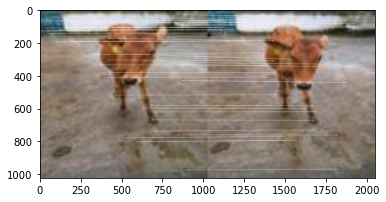

Test Image :IMG_20200922_142824_1.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142823.jpg
Matched	 73 142 133 142 133 54.88721804511278


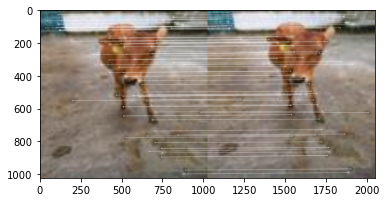

Test Image :IMG_20200922_142824_1.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142824.jpg
Matched	 89 142 145 142 145 62.676056338028175


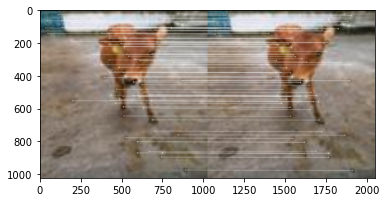

Test Image :IMG_20200922_142824_1.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142824_2.jpg
Matched	 87 142 143 142 143 61.267605633802816


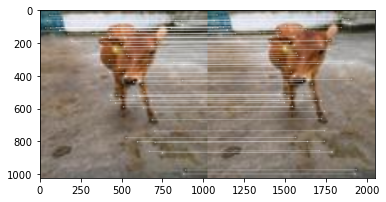

Test Image :IMG_20200922_142824_1.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142825.jpg
Matched	 71 142 132 142 132 53.78787878787878


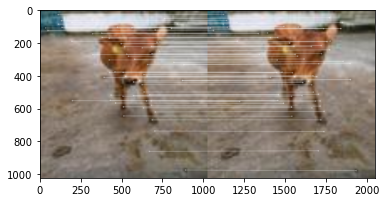

Test Image :IMG_20200922_142824_1.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142825_1.jpg
Matched	 57 142 137 142 137 41.605839416058394


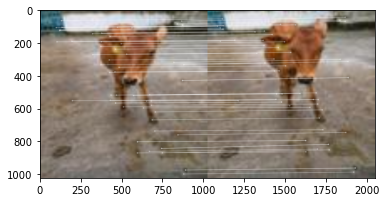

Test Image :IMG_20200922_142824_1.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142826.jpg
Matched	 42 142 128 142 128 32.8125


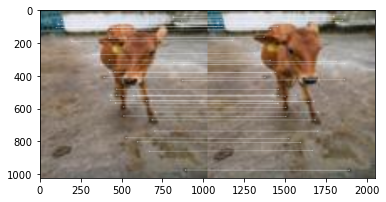

Test Image :IMG_20200922_142824_1.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142826_1.jpg
Matched	 44 142 143 142 143 30.985915492957744


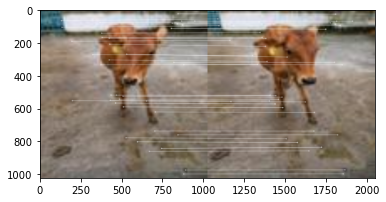

Test Image :IMG_20200922_142824_1.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142828.jpg
Matched	 20 142 115 142 115 17.391304347826086


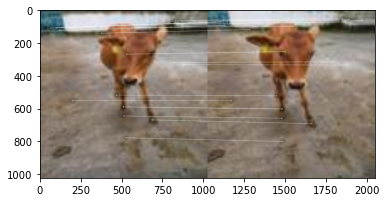

Test Image :IMG_20200922_142824_1.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142830.jpg
Matched	 21 142 155 142 155 14.788732394366196


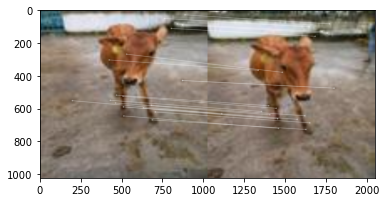

Test Image :IMG_20200922_142824_1.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142832.jpg
Matched	 21 142 117 142 117 17.94871794871795


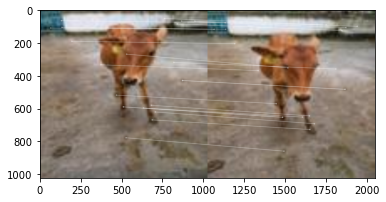

Test Image :IMG_20200922_142824_1.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142833.jpg
Matched	 25 142 141 142 141 17.73049645390071


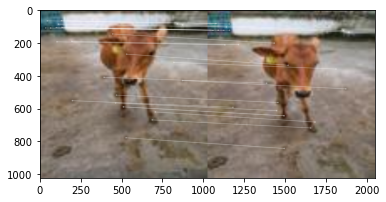

Test Image :IMG_20200922_142824_1.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142836.jpg
Matched	 30 142 146 142 146 21.12676056338028


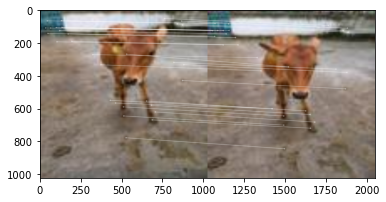

Test Image :IMG_20200922_142824_1.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142836_1.jpg
Matched	 43 142 142 142 142 30.28169014084507


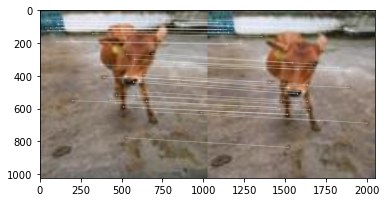

Test Image :IMG_20200922_142824_1.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142837.jpg
Matched	 23 142 139 142 139 16.546762589928058


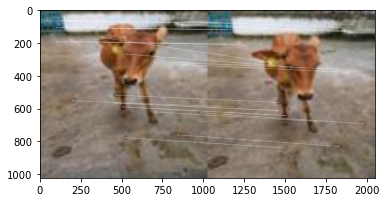

Test Image :IMG_20200922_142824_1.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142840.jpg
Matched	 30 142 132 142 132 22.727272727272727


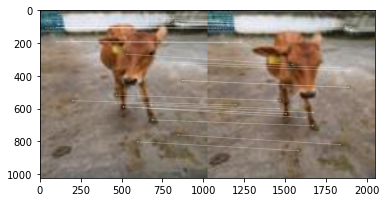

Test Image :IMG_20200922_142824_1.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142841.jpg
Matched	 29 142 121 142 121 23.96694214876033


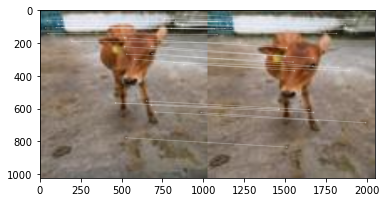

Test Image :IMG_20200922_142824_1.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142842.jpg
Matched	 25 142 125 142 125 20.0


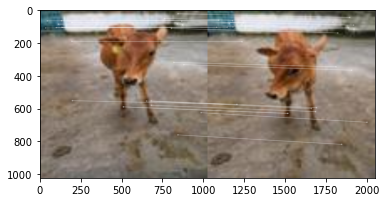

Test Image :IMG_20200922_142824_1.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142843.jpg
Matched Images for test image IMG_20200922_142831.jpg
Matched	 24 113 150 113 150 21.238938053097346


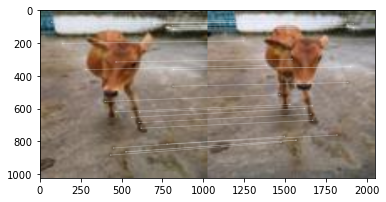

Test Image :IMG_20200922_142831.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142823.jpg
Matched	 27 113 133 113 133 23.893805309734514


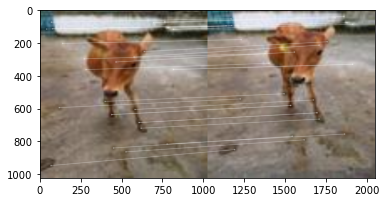

Test Image :IMG_20200922_142831.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142824.jpg
Matched	 28 113 145 113 145 24.778761061946902


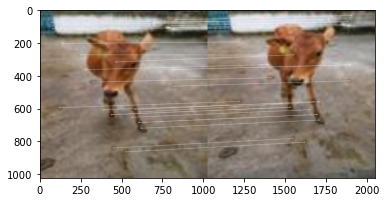

Test Image :IMG_20200922_142831.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142824_2.jpg
Matched	 25 113 143 113 143 22.123893805309734


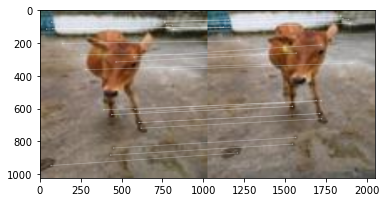

Test Image :IMG_20200922_142831.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142825.jpg
Matched	 21 113 132 113 132 18.58407079646018


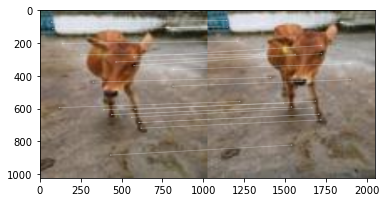

Test Image :IMG_20200922_142831.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142825_1.jpg
Matched	 25 113 137 113 137 22.123893805309734


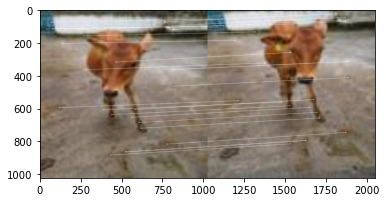

Test Image :IMG_20200922_142831.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142826.jpg
Matched	 28 113 128 113 128 24.778761061946902


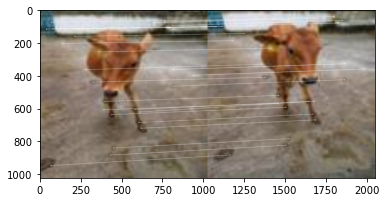

Test Image :IMG_20200922_142831.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142826_1.jpg
Matched	 27 113 143 113 143 23.893805309734514


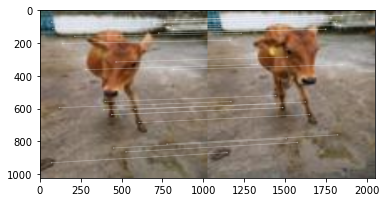

Test Image :IMG_20200922_142831.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142828.jpg
Matched	 23 113 115 113 115 20.353982300884958


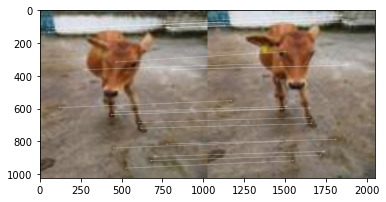

Test Image :IMG_20200922_142831.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142830.jpg
Matched	 29 113 155 113 155 25.663716814159294


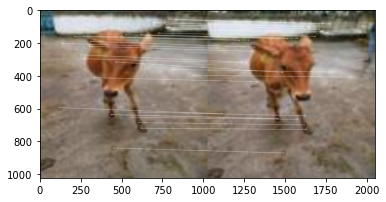

Test Image :IMG_20200922_142831.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142832.jpg
Matched	 28 113 117 113 117 24.778761061946902


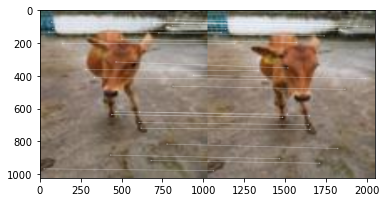

Test Image :IMG_20200922_142831.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142833.jpg
Matched	 34 113 141 113 141 30.08849557522124


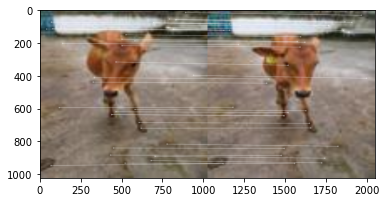

Test Image :IMG_20200922_142831.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142836.jpg
Matched	 40 113 146 113 146 35.39823008849557


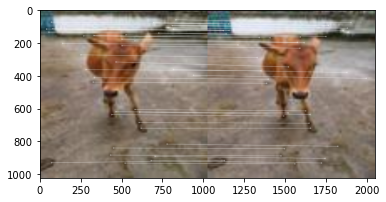

Test Image :IMG_20200922_142831.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142836_1.jpg
Matched	 49 113 142 113 142 43.36283185840708


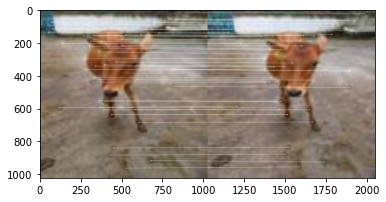

Test Image :IMG_20200922_142831.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142837.jpg
Matched	 31 113 139 113 139 27.43362831858407


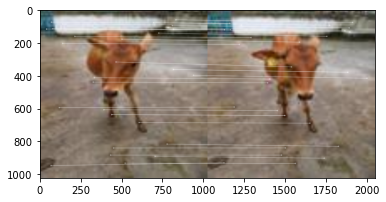

Test Image :IMG_20200922_142831.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142840.jpg
Matched	 35 113 132 113 132 30.973451327433626


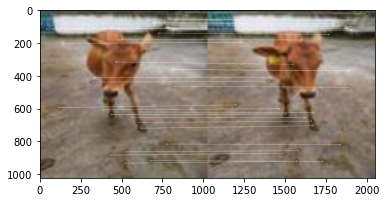

Test Image :IMG_20200922_142831.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142841.jpg
Matched	 55 113 121 113 121 48.67256637168141


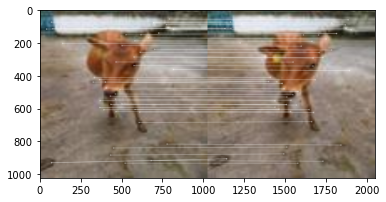

Test Image :IMG_20200922_142831.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142842.jpg
Matched	 31 113 125 113 125 27.43362831858407


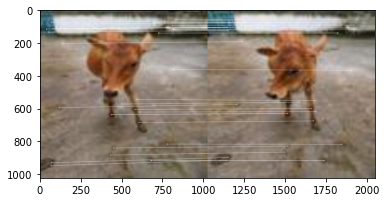

Test Image :IMG_20200922_142831.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142843.jpg
Matched Images for test image IMG_20200922_142839.jpg
Matched	 48 154 150 154 150 32.0


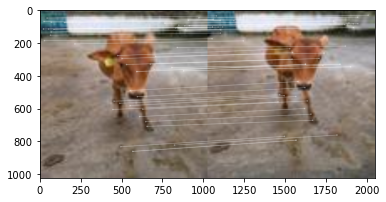

Test Image :IMG_20200922_142839.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142823.jpg
Matched	 29 154 133 154 133 21.804511278195488


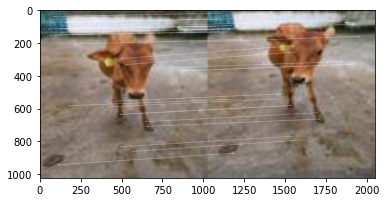

Test Image :IMG_20200922_142839.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142824.jpg
Matched	 32 154 145 154 145 22.06896551724138


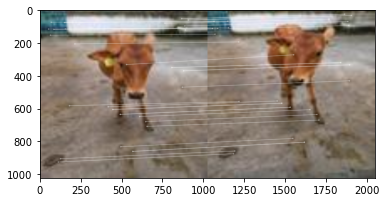

Test Image :IMG_20200922_142839.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142824_2.jpg
Matched	 28 154 143 154 143 19.58041958041958


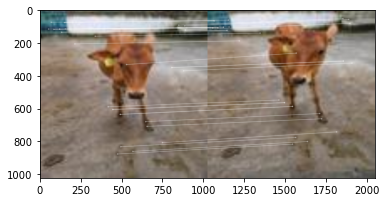

Test Image :IMG_20200922_142839.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142825.jpg
Matched	 25 154 132 154 132 18.939393939393938


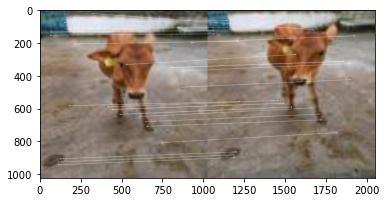

Test Image :IMG_20200922_142839.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142825_1.jpg
Matched	 36 154 137 154 137 26.277372262773724


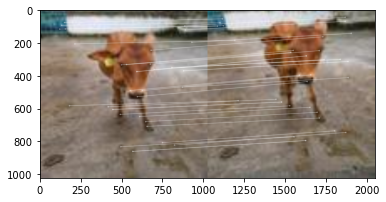

Test Image :IMG_20200922_142839.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142826.jpg
Matched	 29 154 128 154 128 22.65625


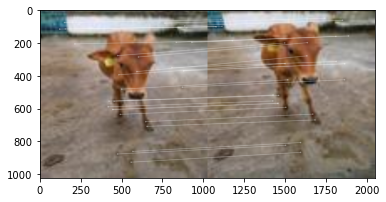

Test Image :IMG_20200922_142839.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142826_1.jpg
Matched	 37 154 143 154 143 25.874125874125873


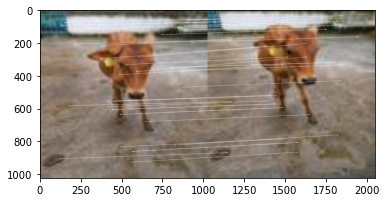

Test Image :IMG_20200922_142839.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142828.jpg
Matched	 38 154 115 154 115 33.04347826086956


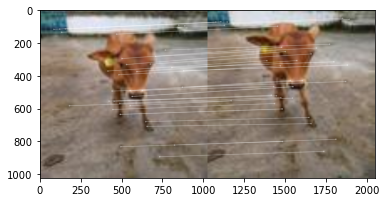

Test Image :IMG_20200922_142839.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142830.jpg
Matched	 31 154 155 154 155 20.12987012987013


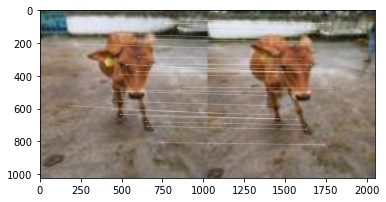

Test Image :IMG_20200922_142839.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142832.jpg
Matched	 45 154 117 154 117 38.46153846153847


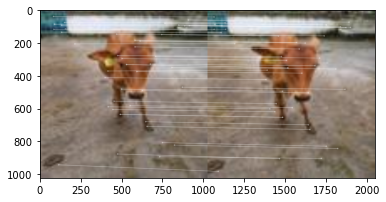

Test Image :IMG_20200922_142839.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142833.jpg
Matched	 57 154 141 154 141 40.42553191489361


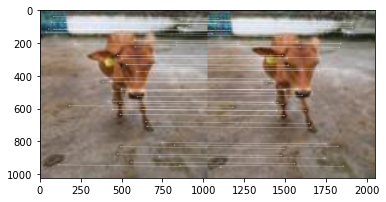

Test Image :IMG_20200922_142839.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142836.jpg
Matched	 66 154 146 154 146 45.20547945205479


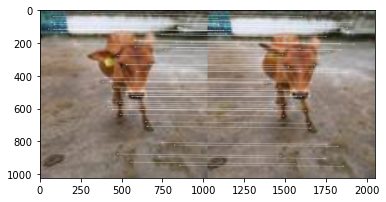

Test Image :IMG_20200922_142839.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142836_1.jpg
Matched	 44 154 142 154 142 30.985915492957744


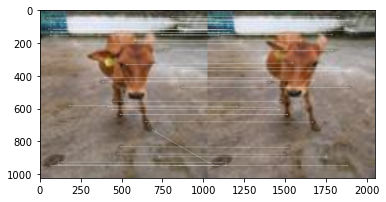

Test Image :IMG_20200922_142839.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142837.jpg
Matched	 59 154 139 154 139 42.44604316546763


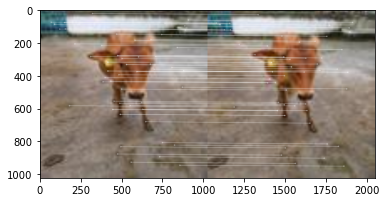

Test Image :IMG_20200922_142839.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142840.jpg
Matched	 66 154 132 154 132 50.0


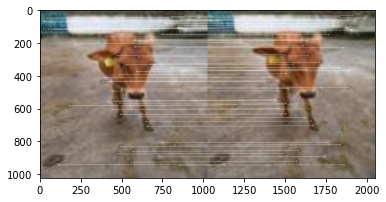

Test Image :IMG_20200922_142839.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142841.jpg
Matched	 43 154 121 154 121 35.53719008264463


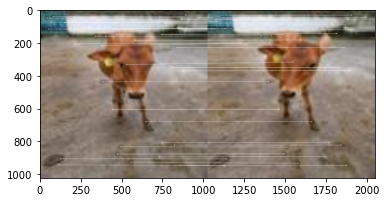

Test Image :IMG_20200922_142839.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142842.jpg
Matched	 43 154 125 154 125 34.4


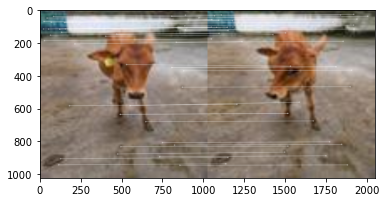

Test Image :IMG_20200922_142839.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142843.jpg
Matched Images for test image IMG_20200922_142852.jpg
Matched	 13 111 101 111 101 12.871287128712872


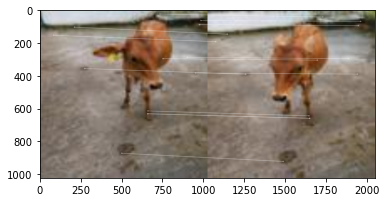

Test Image :IMG_20200922_142852.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142848.jpg
Matched	 18 111 126 111 126 16.216216216216218


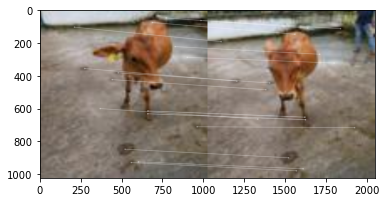

Test Image :IMG_20200922_142852.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142848_1.jpg
Matched	 31 111 93 111 93 33.33333333333333


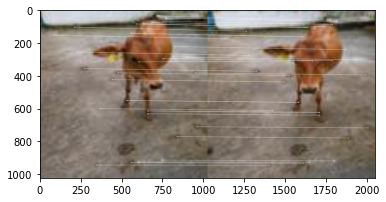

Test Image :IMG_20200922_142852.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142850.jpg
Matched	 40 111 96 111 96 41.66666666666667


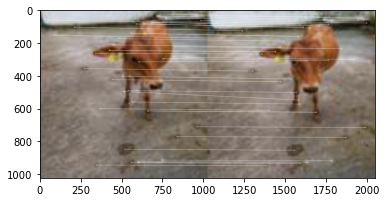

Test Image :IMG_20200922_142852.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142850_1.jpg
Matched	 44 111 94 111 94 46.808510638297875


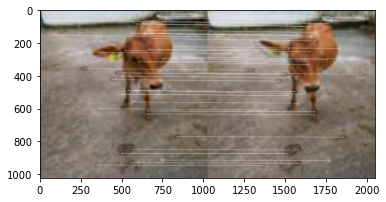

Test Image :IMG_20200922_142852.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142851.jpg
Matched	 62 111 121 111 121 55.85585585585585


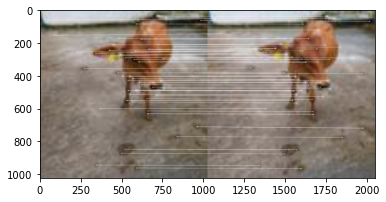

Test Image :IMG_20200922_142852.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142853.jpg
Matched	 32 111 111 111 111 28.82882882882883


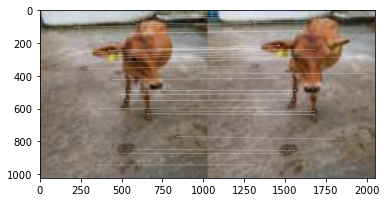

Test Image :IMG_20200922_142852.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142855.jpg
Matched	 17 111 106 111 106 16.037735849056602


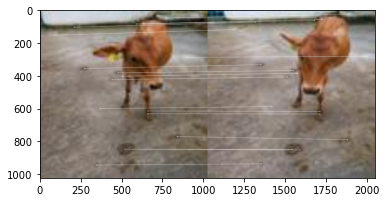

Test Image :IMG_20200922_142852.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142857.jpg
Matched	 22 111 108 111 108 20.37037037037037


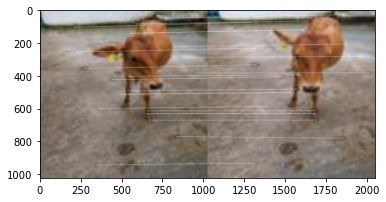

Test Image :IMG_20200922_142852.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142858.jpg
Matched	 38 111 118 111 118 34.234234234234236


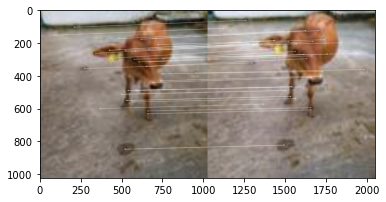

Test Image :IMG_20200922_142852.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142901.jpg
Matched	 37 111 121 111 121 33.33333333333333


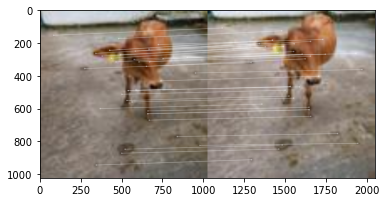

Test Image :IMG_20200922_142852.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142902.jpg
Matched	 15 111 104 111 104 14.423076923076922


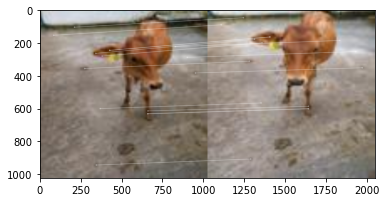

Test Image :IMG_20200922_142852.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142904.jpg
Matched	 18 111 114 111 114 16.216216216216218


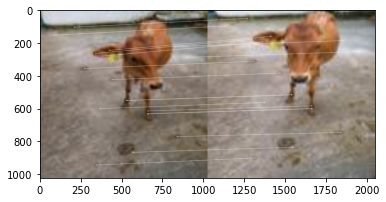

Test Image :IMG_20200922_142852.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142905.jpg
Matched Images for test image IMG_20200922_142900.jpg
Matched	 14 116 101 116 101 13.861386138613863


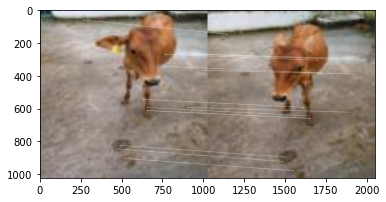

Test Image :IMG_20200922_142900.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142848.jpg
Matched	 12 116 126 116 126 10.344827586206897


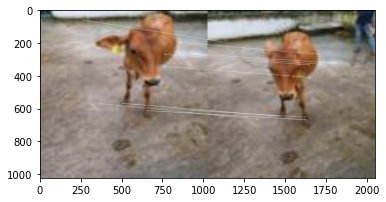

Test Image :IMG_20200922_142900.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142848_1.jpg
Matched	 17 116 93 116 93 18.27956989247312


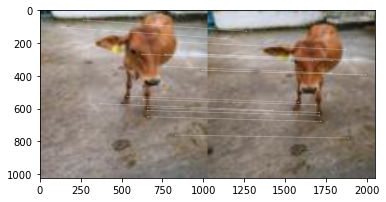

Test Image :IMG_20200922_142900.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142850.jpg
Matched	 19 116 96 116 96 19.791666666666664


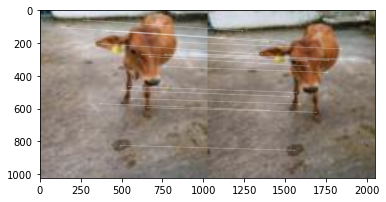

Test Image :IMG_20200922_142900.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142850_1.jpg
Matched	 33 116 94 116 94 35.1063829787234


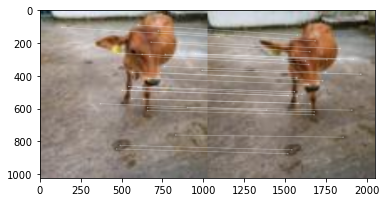

Test Image :IMG_20200922_142900.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142851.jpg
Matched	 45 116 121 116 121 38.793103448275865


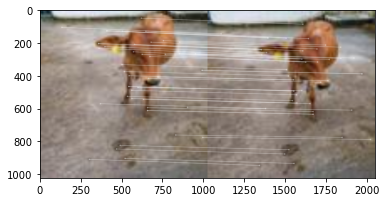

Test Image :IMG_20200922_142900.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142853.jpg
Matched	 49 116 111 116 111 44.14414414414414


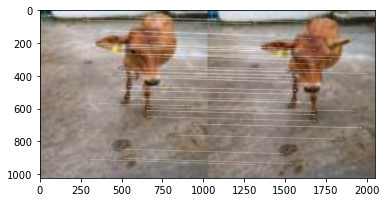

Test Image :IMG_20200922_142900.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142855.jpg
Matched	 22 116 106 116 106 20.754716981132077


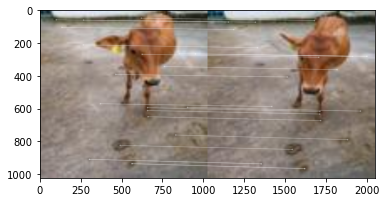

Test Image :IMG_20200922_142900.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142857.jpg
Matched	 36 116 108 116 108 33.33333333333333


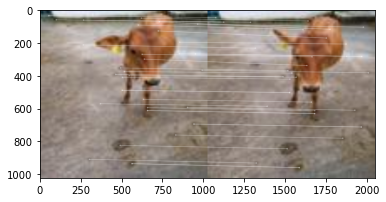

Test Image :IMG_20200922_142900.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142858.jpg
Matched	 74 116 118 116 118 63.793103448275865


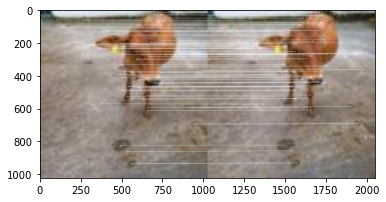

Test Image :IMG_20200922_142900.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142901.jpg
Matched	 72 116 121 116 121 62.06896551724138


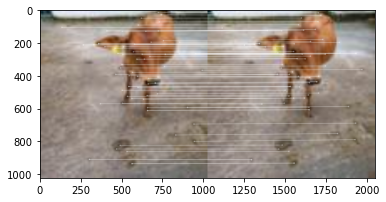

Test Image :IMG_20200922_142900.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142902.jpg
Matched	 31 116 104 116 104 29.807692307692307


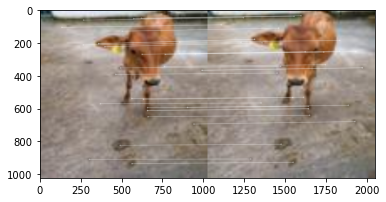

Test Image :IMG_20200922_142900.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142904.jpg
Matched	 33 116 114 116 114 28.947368421052634


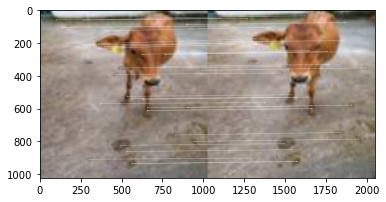

Test Image :IMG_20200922_142900.jpg	Match Train Folder:2598  Match Train file:IMG_20200922_142905.jpg
Matched Images for test image IMG_20200922_143110.jpg
Matched	 62 207 225 207 225 29.951690821256037


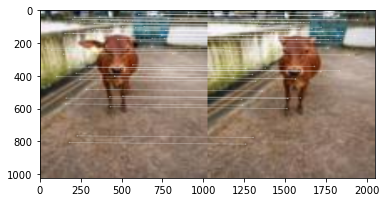

Test Image :IMG_20200922_143110.jpg	Match Train Folder:2585  Match Train file:IMG_20200922_143111.jpg
Matched	 70 207 234 207 234 33.81642512077295


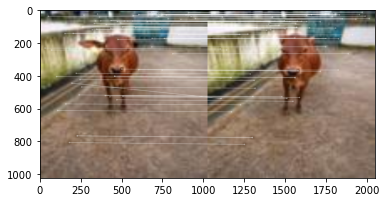

Test Image :IMG_20200922_143110.jpg	Match Train Folder:2585  Match Train file:IMG_20200922_143112.jpg
Matched	 50 207 228 207 228 24.154589371980677


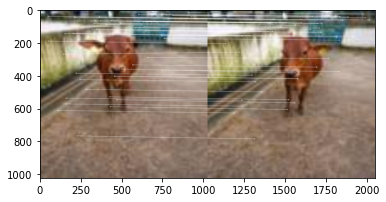

Test Image :IMG_20200922_143110.jpg	Match Train Folder:2585  Match Train file:IMG_20200922_143112_2.jpg
Matched	 48 207 227 207 227 23.18840579710145


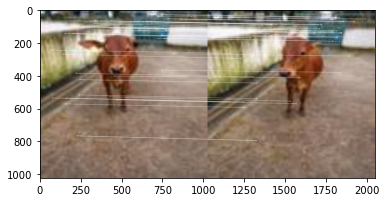

Test Image :IMG_20200922_143110.jpg	Match Train Folder:2585  Match Train file:IMG_20200922_143113.jpg
Matched	 44 207 229 207 229 21.256038647342994


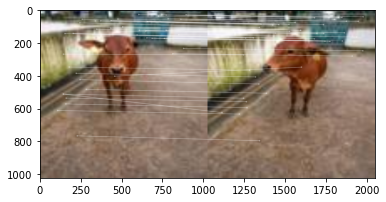

Test Image :IMG_20200922_143110.jpg	Match Train Folder:2585  Match Train file:IMG_20200922_143113_2.jpg
Matched	 29 207 271 207 271 14.009661835748794


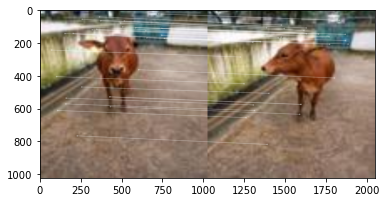

Test Image :IMG_20200922_143110.jpg	Match Train Folder:2585  Match Train file:IMG_20200922_143114.jpg
Matched Images for test image IMG_20200922_143113_1.jpg
Matched	 80 234 225 234 225 35.55555555555556


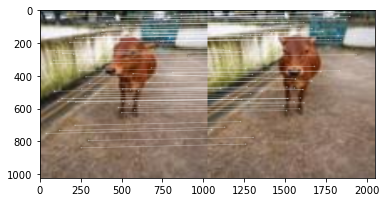

Test Image :IMG_20200922_143113_1.jpg	Match Train Folder:2585  Match Train file:IMG_20200922_143111.jpg
Matched	 81 234 234 234 234 34.61538461538461


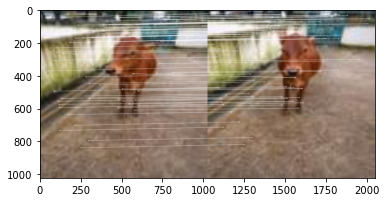

Test Image :IMG_20200922_143113_1.jpg	Match Train Folder:2585  Match Train file:IMG_20200922_143112.jpg
Matched	 98 234 228 234 228 42.98245614035088


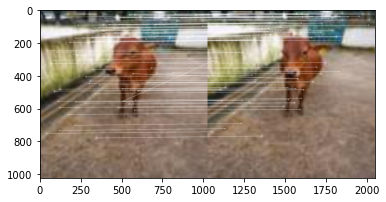

Test Image :IMG_20200922_143113_1.jpg	Match Train Folder:2585  Match Train file:IMG_20200922_143112_2.jpg
Matched	 123 234 227 234 227 54.18502202643172


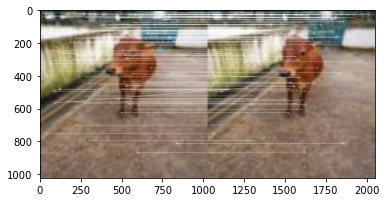

Test Image :IMG_20200922_143113_1.jpg	Match Train Folder:2585  Match Train file:IMG_20200922_143113.jpg
Matched	 95 234 229 234 229 41.48471615720524


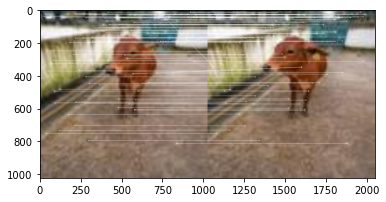

Test Image :IMG_20200922_143113_1.jpg	Match Train Folder:2585  Match Train file:IMG_20200922_143113_2.jpg
Matched	 73 234 271 234 271 31.196581196581196


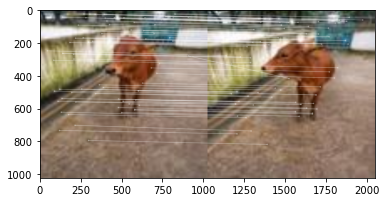

Test Image :IMG_20200922_143113_1.jpg	Match Train Folder:2585  Match Train file:IMG_20200922_143114.jpg
Matched	 28 234 257 234 257 11.965811965811966


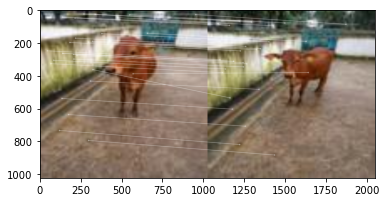

Test Image :IMG_20200922_143113_1.jpg	Match Train Folder:2585  Match Train file:IMG_20200922_143148.jpg
Matched	 31 234 259 234 259 13.247863247863249


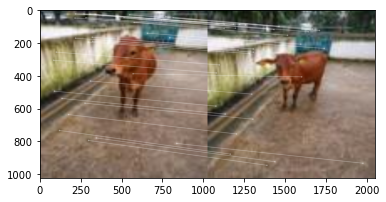

Test Image :IMG_20200922_143113_1.jpg	Match Train Folder:2585  Match Train file:IMG_20200922_143149_1.jpg
Matched Images for test image IMG_20200922_143126.jpg
Matched	 17 266 166 266 166 10.240963855421686


KeyboardInterrupt: 

In [43]:
for i in range(len(testList)):
    testfile=testList[i].split('/')[-1]
    print(f'Matched Images for test image {testfile}')
    for j in range(len(imageList)):
        score=calculateResultsFor(i,j)
        if score>=10:
            trainfile=imageList[j].split('/')
            print(f'Test Image :{testfile}\tMatch Train Folder:{trainfile[-2]}  Match Train file:{trainfile[-1]}')
        